In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from torchvision import transforms, models

from nltk.tokenize import sent_tokenize, word_tokenize
import nltk

from sklearn.model_selection import train_test_split

from collections import Counter
import math

from PIL import Image

from datasets import load_dataset
import os

from transformers import ViTModel
from torch.optim.lr_scheduler import ReduceLROnPlateau
import torch.optim as optim

In [2]:
# Check if GPU is available and use it
if torch.cuda.is_available():
    device = torch.device("cuda")
    print('We will use the GPU:', torch.cuda.get_device_name(0))
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

We will use the GPU: Tesla P100-PCIE-16GB


In [3]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [4]:
images_path = '/kaggle/input/nepali-caption/Image_captioning/Images'
captions_file = '/kaggle/input/nepali-caption/Image_captioning/corrected_Nepali_captions.csv'

nepali_captions = '/kaggle/working/corrected_Nepali_captions_with_headers.csv'


df = pd.read_csv(captions_file, header=None)
df.columns = ['image', 'caption']
df.to_csv(nepali_captions, index=False)
df.head(10)

,image,caption
0,1000268201_693b08cb0e.jpg,गुलाबी लुगा लगाएको बच्चा प्रवेश गर्ने बाटोमा स...
1,1000268201_693b08cb0e.jpg,एउटी केटी काठको भवनमा जाँदै।
2,1000268201_693b08cb0e.jpg,एउटी सानी केटी काठको प्लेहाउसमा चढ्दै।
3,1000268201_693b08cb0e.jpg,एउटी सानी केटी आफ्नो खेलघरमा सिँढी चढ्दै।
4,1000268201_693b08cb0e.jpg,गुलाबी लुगा लगाएकी एउटी सानी केटी काठको केबिनम...
5,1001773457_577c3a7d70.jpg,एउटा कालो कुकुर र दाग भएको कुकुर लडिरहेका छन्
6,1001773457_577c3a7d70.jpg,एउटा कालो कुकुर र तीन रङ्गको कुकुर सडकमा एकअर्...
7,1001773457_577c3a7d70.jpg,कालो कुकुर र खैरो दाग भएको सेतो कुकुर सडकमा एक...
8,1001773457_577c3a7d70.jpg,सडकमा एकअर्कालाई हेर्दै विभिन्न जातका दुई कुकु...
9,1001773457_577c3a7d70.jpg,फुटपाथमा दुईवटा कुकुरहरू एकअर्कातिर सर्दै छन्।


In [5]:


imgs = []
prompts = []

with open(nepali_captions, 'r') as f:
    total_lines = sum(1 for line in f) - 1
    
with open (nepali_captions, 'r') as f:
    next(f)
    for i, line in enumerate(tqdm(f, total = total_lines)):
        if i == 40455:
            break
        
        image, caption = line.strip().split(',', 1)
        
        image = image.split('#')[0] 
        
        image_path = os.path.join(images_path, image.strip())
        
        # Open the image and convert to RGB
        try:
            img = Image.open(image_path).convert('RGB')
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")
            continue  # Skip if image fails to load

        # Append image and caption to lists
        imgs.append(img)
        prompts.append(caption)

# Optionally, print lengths to verify
print(f"Total images loaded: {len(imgs)}")
print(f"Total captions loaded: {len(prompts)}")

  0%|          | 0/38300 [00:00<?, ?it/s]

Total images loaded: 38300
Total captions loaded: 38300


In [6]:
vocab = set(['<bos>', '<eos>', '<unk>', '<pad>'])

for prompt in prompts:
    for word in word_tokenize(prompt):
        vocab.add(word.lower())

In [7]:
len(vocab)

15068

In [8]:
word2ind = {word: i for i, word in enumerate(vocab)}
ind2word = {i: word for word, i in word2ind.items()}

In [9]:
def preprocess_img(img):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    img = transform(img)
    return img

def preprocess_prompt(prompt):
    tokenized_prompt = [word2ind['<bos>']]
    tokenized_prompt += [word2ind.get(token.lower(), word2ind['<unk>']) for token in word_tokenize(prompt)]
    tokenized_prompt += [word2ind['<eos>']]
    
    return tokenized_prompt

In [10]:
class Img2textDataset(Dataset):
    def __init__(self, imgs, prompts):
        self.imgs = imgs
        self.prompts = prompts
        
    def __getitem__(self, idx):
        return preprocess_img(self.imgs[idx]), preprocess_prompt(self.prompts[idx])
    
    def __len__(self):
        return len(self.imgs)

In [11]:
def collate_fn_with_padding(batch):
    imgs, prompts = zip(*batch)
    imgs = torch.stack(imgs, dim=0)
    
    seq_lens = [len(prompt) for img, prompt in batch]
    max_seq_len = max(seq_lens)
    
    padded_prompts = [prompt + [word2ind['<pad>']] * (max_seq_len - len(prompt)) for prompt in prompts]
    padded_prompts = torch.LongTensor(padded_prompts)
    
    return imgs, padded_prompts[:,:-1], padded_prompts[:,1:]

In [12]:
train_imgs, test_imgs, train_prompts, test_prompts = train_test_split(imgs, prompts, test_size=0.2)

train_dataset = Img2textDataset(train_imgs, train_prompts)
test_dataset = Img2textDataset(test_imgs, test_prompts)

BATCH_SIZE = 64

train_dataloader = DataLoader(
    train_dataset, collate_fn=collate_fn_with_padding, batch_size=BATCH_SIZE, shuffle=True
)

test_dataloader = DataLoader(
    test_dataset, collate_fn=collate_fn_with_padding, batch_size=BATCH_SIZE
)

In [13]:
class Encoder(nn.Module):
    def __init__(self, embed_dim, num_unfrozen_layers=2):
        super(Encoder, self).__init__()
        
        self.vit = ViTModel.from_pretrained('google/vit-base-patch16-224-in21k')
        
        for param in self.vit.parameters():
            param.requires_grad = False
            
        if num_unfrozen_layers > 0:
            for layer in self.vit.encoder.layer[-num_unfrozen_layers:]:
                for param in layer.parameters():
                    param.requires_grad = True
        
        self.fc = nn.Linear(self.vit.config.hidden_size, embed_dim)
        
    def forward(self, x):
        with torch.no_grad():
            outputs = self.vit(x)
            x = outputs.last_hidden_state[:, 0]
        
        x = self.fc(x)
        return x

In [14]:
class Decoder(nn.Module):
    def __init__(self, hidden_dim, vocab_size, num_layers):
        super(Decoder, self).__init__()
        
        self.embedding = nn.Embedding(vocab_size, hidden_dim)
        self.rnn = nn.LSTM(hidden_dim, hidden_dim, num_layers=num_layers, dropout=0.5, batch_first=True)
        self.linear = nn.Linear(hidden_dim, hidden_dim)
        self.projection = nn.Linear(hidden_dim, vocab_size)
        self.non_lin = nn.ReLU()
        self.dropout = nn.Dropout(p=0.5)

    def forward(self, input_batch, hidden_state=None):
        embeddings = self.embedding(input_batch)
        
        if hidden_state is None:
            output, hidden_state = self.rnn(embeddings)
        else:
            output, hidden_state = self.rnn(embeddings, hidden_state)

        output = self.dropout(self.linear(self.non_lin(output)))
        projection = self.projection(output)
        return projection, hidden_state

In [15]:
class Img2textModel(nn.Module):
    def __init__(self, embed_dim, hidden_dim, vocab_size, num_layers):
        super(Img2textModel, self).__init__()
        
        self.encoder = Encoder(embed_dim)
        self.decoder = Decoder(hidden_dim, vocab_size, num_layers)
        self.init_hidden_layer = nn.Linear(embed_dim, hidden_dim)
        self.init_cell_layer = nn.Linear(embed_dim, hidden_dim)
        
        self.num_layers = num_layers
        
    def forward(self, images, captions):
        features = self.encoder(images)  
        
        hidden_state = self.init_hidden_layer(features)
        cell_state = self.init_cell_layer(features)

        hidden_state = hidden_state.unsqueeze(0).repeat(self.num_layers, 1, 1)
        cell_state = cell_state.unsqueeze(0).repeat(self.num_layers, 1, 1)
        
        outputs, _ = self.decoder(captions, (hidden_state, cell_state))
        
        return outputs

In [16]:
def validate_model(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0

    with torch.no_grad():
        for images, inputs, targets in dataloader:
            images = images.to(device)
            inputs = inputs.to(device)
            targets = targets.to(device)
            
            outputs = model(images, inputs)
            
            loss = criterion(outputs.view(-1, outputs.size(2)), targets.reshape(-1))
            
            running_loss += loss.item()

    validation_loss = running_loss / len(dataloader)
    print(f'Validation Loss: {validation_loss:.4f}')
    model.train()
    return validation_loss 

In [17]:
#  training and validation function with gradient clipping
def train(model, train_dataloader, test_dataloader, criterion, optimizer, scheduler, num_epochs, device):
    model = model.to(device)
    
    for epoch in range(num_epochs):
        running_loss = 0.0
        model.train()  
        
        with tqdm(total=len(train_dataloader), desc="Training", unit="batch") as pbar:
            for i, (images, inputs, targets) in enumerate(train_dataloader):
                images = images.to(device)
                inputs = inputs.to(device)
                targets = targets.to(device)

                optimizer.zero_grad()
                
                # Forward pass
                outputs = model(images, inputs)  # (batch_size, seq_len, vocab_size)

                
                loss = criterion(outputs.view(-1, outputs.size(2)), targets.reshape(-1))

                # Backward pass with gradient clipping
                loss.backward()
                
                # Clip gradients to prevent exploding gradients
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)  # Gradient clipping
                
                optimizer.step()

                running_loss += loss.item()

                if (i + 1) % 10 == 0:
                    pbar.set_postfix({'Loss': running_loss / (i + 1)})
    
                pbar.update(1)

        epoch_loss = running_loss / len(train_dataloader)
        print(f'Epoch {epoch + 1} Loss: {epoch_loss:.4f}')
        
        # Validate the model
        val_loss = validate_model(model, test_dataloader, criterion, device)

        
        scheduler.step(val_loss)  # Adjusting the learning rate using the scheduler based on validation loss
        
    model.to('cpu')  



In [18]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = Img2textModel(embed_dim=1024, hidden_dim=512, vocab_size=len(vocab), num_layers=1)
criterion = nn.CrossEntropyLoss(ignore_index=word2ind['<pad>'])
optimizer = torch.optim.Adam(model.parameters())
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, verbose=True)

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/torch/nn/modules/rnn.py:88: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


In [19]:
num_params = sum(p.numel() for p in model.parameters())
param_size_bytes = 4
total_size_bytes = num_params * param_size_bytes
total_size_megabytes = total_size_bytes / (1024 ** 2)
print(f"Model size: {total_size_megabytes:.2f} MB")

Model size: 404.49 MB


In [20]:
train(model, train_dataloader, test_dataloader, criterion, optimizer,scheduler,7, device)

Training:   0%|          | 0/479 [00:00<?, ?batch/s]

Epoch 1 Loss: 5.1716
Validation Loss: 4.4358


Training:   0%|          | 0/479 [00:00<?, ?batch/s]

Epoch 2 Loss: 4.1957
Validation Loss: 4.1225


Training:   0%|          | 0/479 [00:00<?, ?batch/s]

Epoch 3 Loss: 3.7755
Validation Loss: 4.0135


Training:   0%|          | 0/479 [00:00<?, ?batch/s]

Epoch 4 Loss: 3.4411
Validation Loss: 4.0009


Training:   0%|          | 0/479 [00:00<?, ?batch/s]

Epoch 5 Loss: 3.1273
Validation Loss: 4.0495


Training:   0%|          | 0/479 [00:00<?, ?batch/s]

Epoch 6 Loss: 2.8404
Validation Loss: 4.0934


Training:   0%|          | 0/479 [00:00<?, ?batch/s]

Epoch 7 Loss: 2.5786
Validation Loss: 4.2079


In [96]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

model_save_path = '/kaggle/working/english_model.pth'
torch.save(model.state_dict(), model_save_path)
print(f"Model saved to {model_save_path}")




Model saved to /kaggle/working/english_model.pth


In [22]:
import torch

def generate_caption_beam_search(model, img, word2ind, ind2word, max_length=50, beam_width=4, device='cpu'):
    model.to(device)
    model.eval()
    
    img = preprocess_img(img).unsqueeze(0).to(device)
    
    with torch.no_grad():
        
        features = model.encoder(img)
        
        hidden_state = model.init_hidden_layer(features)
        cell_state = model.init_cell_layer(features)
        num_layers = model.num_layers
        hidden_state = hidden_state.unsqueeze(0).repeat(num_layers, 1, 1)
        cell_state = cell_state.unsqueeze(0).repeat(num_layers, 1, 1)
        
        # beam with the <bos> token
        initial_input_token = torch.LongTensor([word2ind['<bos>']]).unsqueeze(0).to(device)
        
       
        beams = [(initial_input_token, 0.0, hidden_state, cell_state)]
        
        for _ in range(max_length):
            all_candidates = []
            for seq, score, h, c in beams:
                if seq[-1].item() == word2ind['<eos>']:  # If EOS token, finalize this sequence
                    all_candidates.append((seq, score, h, c))
                    continue

                
                output, (h, c) = model.decoder(seq[-1].unsqueeze(0), (h, c))
                
                
                probabilities = torch.log_softmax(output.squeeze(0), dim=-1)

                
                top_probs, top_tokens = probabilities.topk(beam_width)

                for i in range(beam_width):
                    next_token = top_tokens[0, i].item()
                    next_prob = top_probs[0, i].item()

                    # Construct new candidate
                    #new_seq = torch.cat([seq, torch.LongTensor([next_token]).to(device)])
                    new_seq = torch.cat([seq, torch.LongTensor([next_token]).unsqueeze(0).to(device)], dim=0)

                    new_score = score + next_prob
                    all_candidates.append((new_seq, new_score, h, c))

            # Order all candidates by score and select the best `beam_width` candidates
            ordered = sorted(all_candidates, key=lambda x: x[1], reverse=True)
            beams = ordered[:beam_width]

            
            if all(seq[-1].item() == word2ind['<eos>'] for seq, _, _, _ in beams):
                break
        
        
        best_sequence = beams[0][0]

    # Converting index sequence back to words
    generated_caption = ' '.join([ind2word[idx.item()] for idx in best_sequence if idx.item() not in [word2ind['<bos>'], word2ind['<eos>']]])
    model.to('cpu')
    return generated_caption


In [23]:
def rebuild_img(img):
    inv_normalize = transforms.Normalize(
        mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
        std=[1 / 0.229, 1 / 0.224, 1 / 0.225]
    )

    img_ = inv_normalize(img)

    img_ = img_.permute(1, 2, 0).numpy()

    img_ = np.clip(img_, 0, 1)
    
    return img_

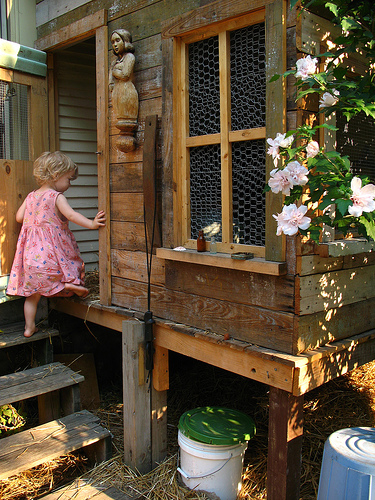

In [24]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1000268201_693b08cb0e.jpg')
img

In [25]:
generate_caption_beam_search(model, img, word2ind, ind2word, device=device)


'एउटी सानी केटी काठको प्लेहाउसमा चढ्दै।'

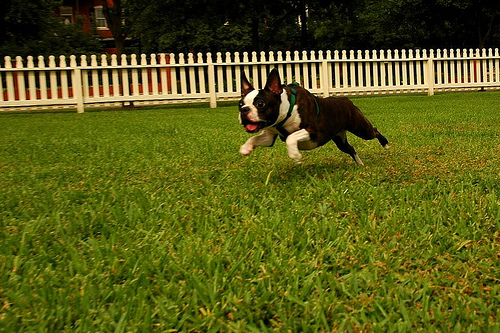

In [26]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1009434119_febe49276a.jpg')
img

In [27]:
generate_caption_beam_search(model, img, word2ind, ind2word, device=device)

'एउटा कालो र सेतो कुकुर घाँसमा दौडिरहेको छ।'

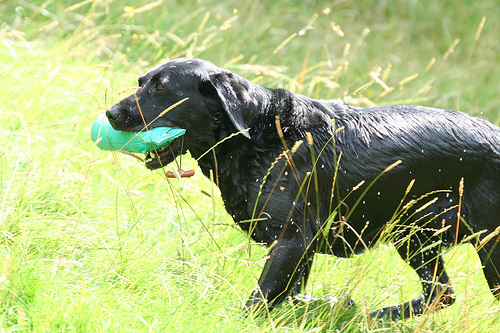

In [28]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1026685415_0431cbf574.jpg')
img

In [29]:
generate_caption_beam_search(model, img, word2ind, ind2word, device=device)

'मुखमा लट्ठी लिएर घाँसमा दौडिरहेको कुकुर।'

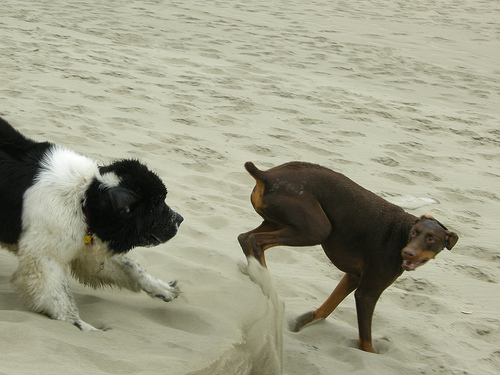

In [30]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1067790824_f3cc97239b.jpg')
img

In [31]:
generate_caption_beam_search(model, img, word2ind, ind2word, device=device)

'दुईवटा कुकुर समुद्र तटमा दौडिरहेका छन्।'

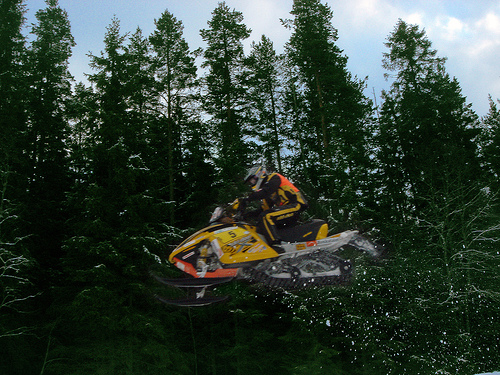

In [32]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/109738763_90541ef30d.jpg')
img

In [33]:
generate_caption_beam_search(model, img, word2ind, ind2word,  device=device)

'हरियो ज्याकेटमा स्नोबोर्डिङ गर्ने व्यक्ति।'

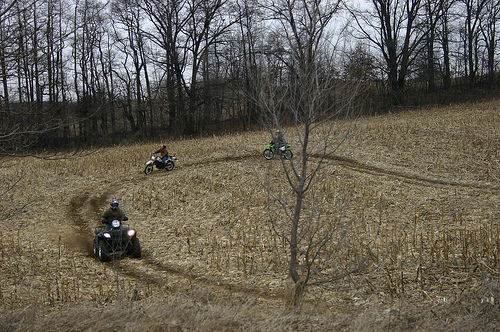

In [34]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/112243673_fd68255217.jpg')
img

In [35]:
generate_caption_beam_search(model, img, word2ind, ind2word,  device=device)

'दुई साना केटाकेटी मैदानमा फोहोर ट्र्याकमा दौडिरहेका छन्।'

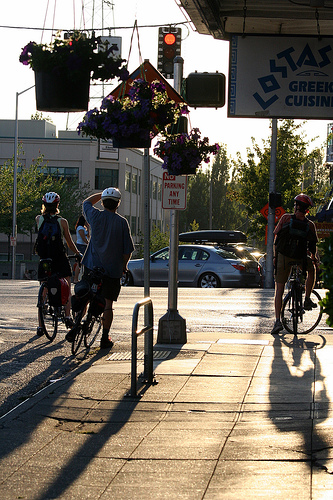

In [36]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1148238960_f8cacec2fc.jpg')
img

In [37]:
generate_caption_beam_search(model, img, word2ind, ind2word,  device=device)

'साइकल चलाउने मानिसहरूको समूह।'

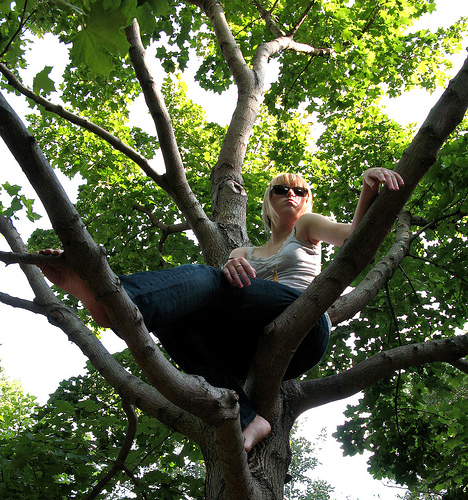

In [94]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1460352062_d64fb633e0.jpg')
img

In [95]:
generate_caption_beam_search(model, img, word2ind, ind2word, device=device)

'एउटी सानी केटी रूखमा जोडिएको झुलामा झुलिरहेको छ।'

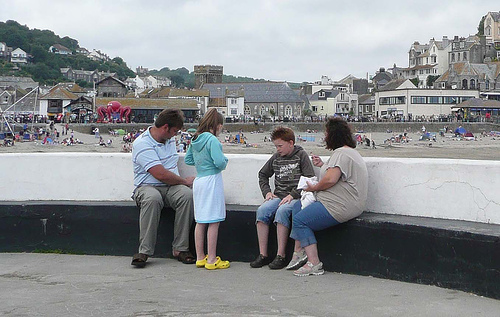

In [40]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1215334959_b1970965f7.jpg')
img

In [41]:
generate_caption_beam_search(model, img, word2ind, ind2word, device=device)

'दुई पुरुष र एक महिला समुद्र तटको छेउमा फुटपाथमा बसिरहेका छन्।'

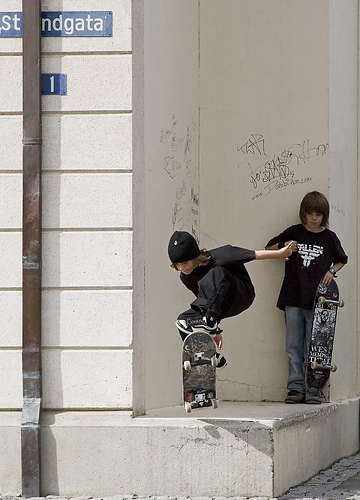

In [43]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1052358063_eae6744153.jpg')
img

In [44]:
generate_caption_beam_search(model, img, word2ind, ind2word, device=device)

'एउटा केटाले स्केटबोर्ड ट्रिक गर्छ।'

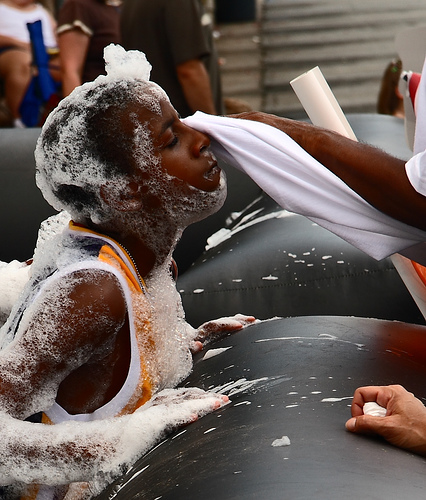

In [48]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1075881101_d55c46bece.jpg')
img

In [49]:
generate_caption_beam_search(model, img, word2ind, ind2word, device=device)

'मानिसहरूको एउटा समूह पानीको फोहरामा खेलिरहेको छ।'

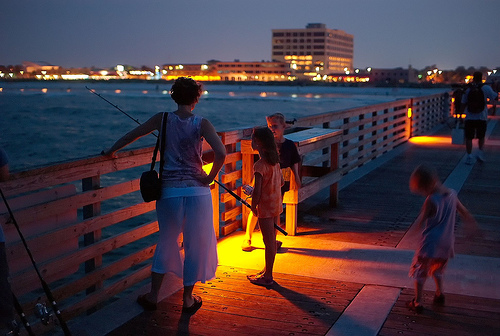

In [51]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1089755335_0bfbfd30e6.jpg')
img

In [52]:
generate_caption_beam_search(model, img, word2ind, ind2word, device=device)

'दुई जना मानिस डकमा उभिएर सूर्यास्त हेर्दै छन्।'

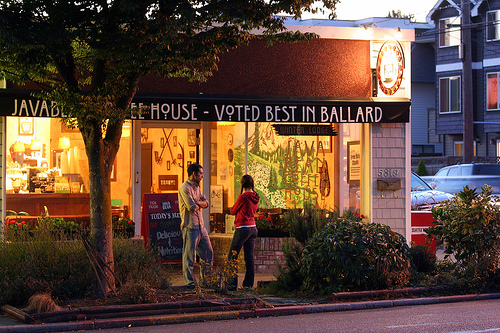

In [78]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1370773415_967b1ffde1.jpg')
img

In [79]:
generate_caption_beam_search(model, img, word2ind, ind2word, device=device)

'दुई जना मानिस भवनको अगाडि उभिरहेका छन्।'

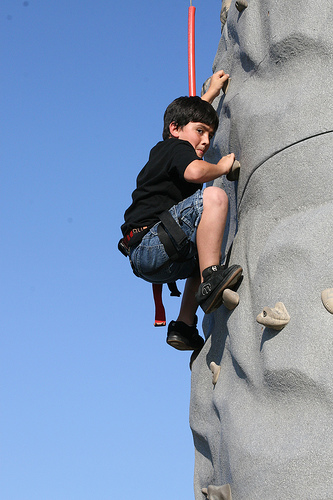

In [76]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1357689954_72588dfdc4.jpg')
img

In [77]:
generate_caption_beam_search(model, img, word2ind, ind2word, device=device)

'एउटा मानिस चट्टान चढ्छ।'

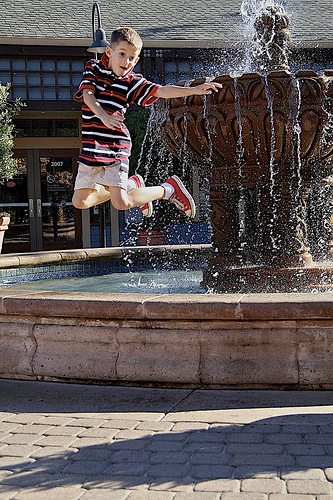

In [59]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1100214449_d10861e633.jpg')
img


In [60]:
generate_caption_beam_search(model, img, word2ind, ind2word, device=device)

'एउटा केटा पोखरीमा हाम फाल्छ।'

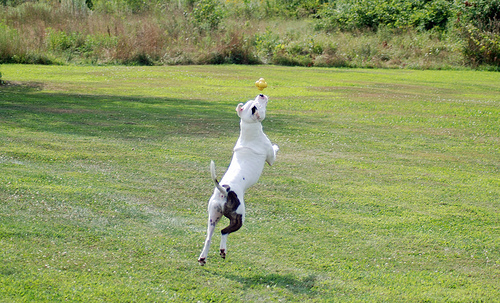

In [61]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1020651753_06077ec457.jpg')
img

In [62]:
generate_caption_beam_search(model, img, word2ind, ind2word, device= device)

'एउटा सेतो कुकुर घाँसमा दौडन्छ।'

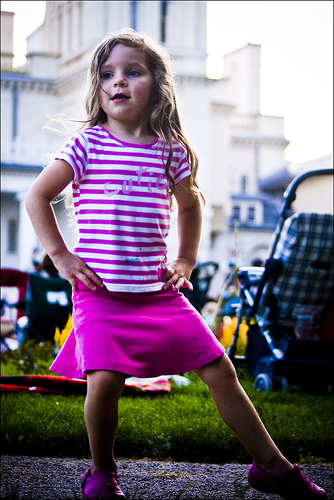

In [65]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1245022983_fb329886dd.jpg')
img

In [66]:
generate_caption_beam_search(model, img, word2ind, ind2word, device= device)

'गुलाबी पोशाकमा एउटी केटी हुला हुपसँग खेल्दै।'

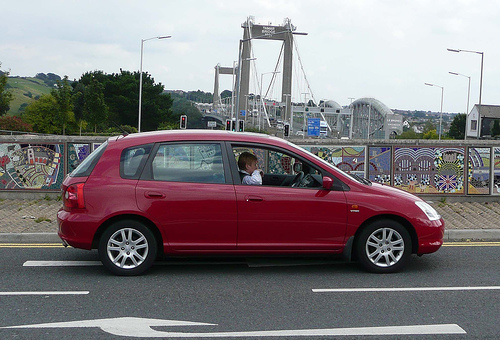

In [67]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1260816604_570fc35836.jpg')
img

In [68]:
generate_caption_beam_search(model, img, word2ind, ind2word, device= device)

'एउटा मानिस रातो रेस कारमा बसिरहेको छ।'

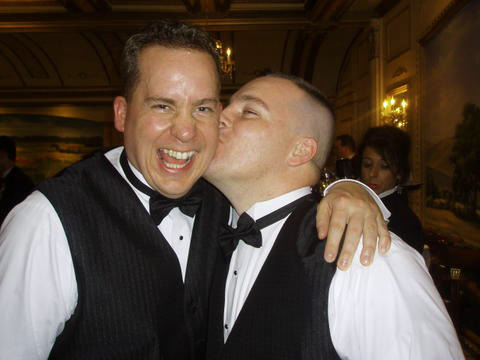

In [71]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/133189853_811de6ab2a.jpg')
img

In [72]:
generate_caption_beam_search(model, img, word2ind, ind2word, device= device)

'दुई पुरुष र एक महिला तस्विरको लागि पोज दिँदै।'

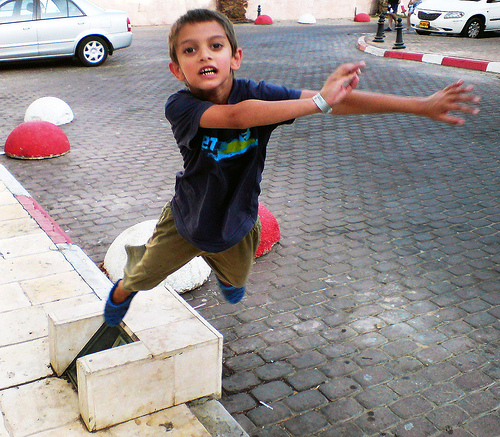

In [84]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/1414779054_31946f9dfc.jpg')
img

In [85]:
generate_caption_beam_search(model, img, word2ind, ind2word, device= device)

'नीलो शर्ट लगाएको एउटा जवान केटाले आफ्नो हात उठाउँछन्।'

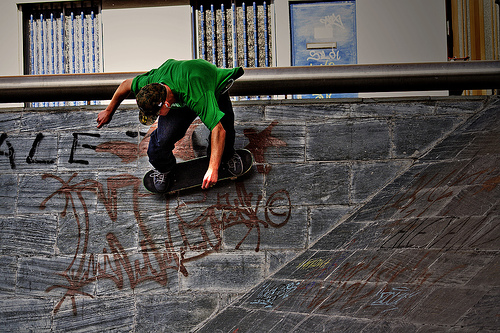

In [88]:
img = Image.open('/kaggle/input/nepali-caption/Image_captioning/Images/142802798_962a4ec5ce.jpg')
img

In [89]:
generate_caption_beam_search(model, img, word2ind, ind2word, device= device)

'एक स्केटबोर्डर सिँढीको रेलिङबाट तल सर्छ।'